# ArtSense AI — EDA + Training Notebook

**Project:** ArtSense AI — Intelligent Art History Learning System  
**Model:** EfficientNet-B3 fine-tuned on 50 historical Western artists  
**Dataset:** [Best Artworks of All Time](https://www.kaggle.com/datasets/ikarus777/best-artworks-of-all-time) (~8,000 images)  

This notebook has two parts:
1. **Exploratory Data Analysis (EDA)** — understand the dataset before training
2. **Model Training** — fine-tune EfficientNet-B3 and save output files for the Gradio app

**Output files produced:**
- `efficientnet_b3_artsense.pth` — trained model weights
- `class_indices.json` — artist name to class index mapping
- `training_curves.png` — loss and accuracy plots

We will download these from the Kaggle output panel and place them in the `model/` folder of the project.

---
# PART 1 — Exploratory Data Analysis (EDA)

Before training any model, it is important to understand the dataset thoroughly.
EDA helps us answer four key questions:
- How many images do we have per artist? (class balance)
- What do the paintings actually look like?
- What metadata do we have about each artist?
- Are there any data quality issues we need to handle?

The findings from EDA directly inform our training decisions, such as using a weighted sampler to fix class imbalance.

## 1. Install & Import

In [1]:
!pip install -q rapidfuzz

import os
import json
import random
import warnings
from pathlib import Path
from collections import Counter

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset, WeightedRandomSampler
from torchvision import models, transforms
from sklearn.model_selection import train_test_split

warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.rcParams['figure.dpi'] = 120

# Fix random seeds for reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Device: {DEVICE}')
print('All libraries loaded successfully.')

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 30.9 MB/s eta 0:00:00a 0:00:01
Device: cuda
All libraries loaded successfully.


## 2. Dataset Paths

In [ ]:
# Try the standard Kaggle mount first; fall back to a custom mount if needed.
# When you click "Add Data -> ikarus777/best-artworks-of-all-time" in the Kaggle
# sidebar, Kaggle mounts the dataset at /kaggle/input/best-artworks-of-all-time.
candidate_roots = [
    Path('/kaggle/input/best-artworks-of-all-time'),
    Path('/kaggle/input/datasets/ikarus777/best-artworks-of-all-time'),
]
DATA_ROOT  = next((p for p in candidate_roots if p.exists()), candidate_roots[0])
IMAGES_DIR = DATA_ROOT / 'images' / 'images'   # images are nested one extra level on Kaggle
CSV_PATH   = DATA_ROOT / 'artists.csv'

print('Data root              :', DATA_ROOT)
print('Images directory exists:', IMAGES_DIR.exists())
print('CSV file exists        :', CSV_PATH.exists())

# Load the canonical 50-artist list from artists.csv. The Gradio app's fuzzy-match
# step looks up the predicted class against this list, so the model must be trained
# on exactly the same set of names.
df_artists      = pd.read_csv(CSV_PATH)
canonical_names = set(df_artists['name'].tolist())

# The Kaggle dataset ships 51 image folders due to a unicode-encoding artefact
# (a duplicate Albrecht Dürer folder). Keep only the 50 folders whose name maps
# cleanly to a row in artists.csv -- otherwise the 51st class would have no
# metadata and the app's fuzzy_match.match_artist() would silently fail on it.
all_folders    = sorted([d for d in IMAGES_DIR.iterdir() if d.is_dir()])
artist_folders = [d for d in all_folders if d.name.replace('_', ' ') in canonical_names]
dropped        = [d.name for d in all_folders if d.name.replace('_', ' ') not in canonical_names]

print(f'\nArtists in CSV         : {len(canonical_names)}')
print(f'Artist folders kept    : {len(artist_folders)}')
if dropped:
    print(f'Folders dropped (not in CSV): {dropped}')

## 3. EDA — Class Distribution (Images per Artist)

The most important EDA step for a classification problem is checking how many samples
each class has. If some artists have far more paintings than others, the model will tend
to favour those artists during training — this is called **class imbalance**.

We will visualise this and then address it later using a **WeightedRandomSampler**.

=== Dataset Size Summary ===
Total images  : 8774
Total artists : 51
Max per artist: 877 (Vincent van Gogh)
Min per artist: 24 (Jackson Pollock)
Mean per artist: 172.0


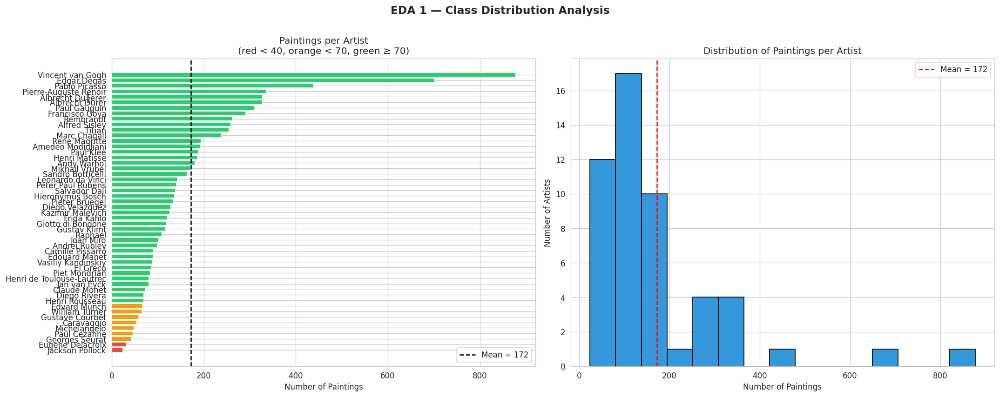


Observation: The dataset is imbalanced. Some artists have 3x more paintings than others.
This motivates using WeightedRandomSampler during training to give equal attention to all artists.


In [3]:
# Count images per artist folder
artist_names  = []
image_counts  = []

for folder in artist_folders:
    count = len(list(folder.glob('*.jpg')))
    artist_names.append(folder.name.replace('_', ' '))
    image_counts.append(count)

# Build a summary DataFrame for easy analysis
df_counts = pd.DataFrame({'artist': artist_names, 'count': image_counts})
df_counts = df_counts.sort_values('count', ascending=False).reset_index(drop=True)

print('=== Dataset Size Summary ===')
print(f'Total images  : {df_counts["count"].sum()}')
print(f'Total artists : {len(df_counts)}')
print(f'Max per artist: {df_counts["count"].max()} ({df_counts.iloc[0]["artist"]})')
print(f'Min per artist: {df_counts["count"].min()} ({df_counts.iloc[-1]["artist"]})')
print(f'Mean per artist: {df_counts["count"].mean():.1f}')

# --- Plot ---
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

# Left: horizontal bar chart sorted by count
colors = ['#e74c3c' if c < 40 else '#f39c12' if c < 70 else '#2ecc71'
          for c in df_counts['count']]
axes[0].barh(df_counts['artist'], df_counts['count'], color=colors)
axes[0].axvline(x=df_counts['count'].mean(), color='black',
                linestyle='--', linewidth=1.5, label=f'Mean = {df_counts["count"].mean():.0f}')
axes[0].set_xlabel('Number of Paintings')
axes[0].set_title('Paintings per Artist\n(red < 40, orange < 70, green ≥ 70)', fontsize=12)
axes[0].legend()
axes[0].invert_yaxis()

# Right: histogram of count distribution
axes[1].hist(df_counts['count'], bins=15, color='#3498db', edgecolor='black')
axes[1].axvline(x=df_counts['count'].mean(), color='red',
                linestyle='--', linewidth=1.5, label=f'Mean = {df_counts["count"].mean():.0f}')
axes[1].set_xlabel('Number of Paintings')
axes[1].set_ylabel('Number of Artists')
axes[1].set_title('Distribution of Paintings per Artist', fontsize=12)
axes[1].legend()

plt.suptitle('EDA 1 — Class Distribution Analysis', fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_class_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print('\nObservation: The dataset is imbalanced. Some artists have 3x more paintings than others.')
print('This motivates using WeightedRandomSampler during training to give equal attention to all artists.')

## 4. EDA — Metadata Analysis (artists.csv)

The `artists.csv` file is the structured knowledge base that powers ArtSense AI's
conversational pipeline. Here we explore what information it contains and whether
it covers all 50 artists without missing values.

We also look at the breakdown by **art movement** and **nationality**, which gives
us a clearer picture of the educational scope of this project.

In [4]:
df_meta = pd.read_csv(CSV_PATH)

print('=== Metadata Overview ===')
print(f'Rows: {len(df_meta)} | Columns: {len(df_meta.columns)}')
print('\nColumns available:')
for col in df_meta.columns:
    missing = df_meta[col].isnull().sum()
    print(f'  {col:<20} — {missing} missing values')

print('\nSample rows:')
df_meta.head(3)

=== Metadata Overview ===
Rows: 50 | Columns: 8

Columns available:
  id                   — 0 missing values
  name                 — 0 missing values
  years                — 0 missing values
  genre                — 0 missing values
  nationality          — 0 missing values
  bio                  — 0 missing values
  wikipedia            — 0 missing values
  paintings            — 0 missing values

Sample rows:


,id,name,years,genre,nationality,bio,wikipedia,paintings
0,0,Amedeo Modigliani,1884 - 1920,Expressionism,Italian,Amedeo Clemente Modigliani (Italian pronunciat...,http://en.wikipedia.org/wiki/Amedeo_Modigliani,193
1,1,Vasiliy Kandinskiy,1866 - 1944,"Expressionism,Abstractionism",Russian,Wassily Wassilyevich Kandinsky (Russian: Васи́...,http://en.wikipedia.org/wiki/Wassily_Kandinsky,88
2,2,Diego Rivera,1886 - 1957,"Social Realism,Muralism",Mexican,Diego María de la Concepción Juan Nepomuceno E...,http://en.wikipedia.org/wiki/Diego_Rivera,70


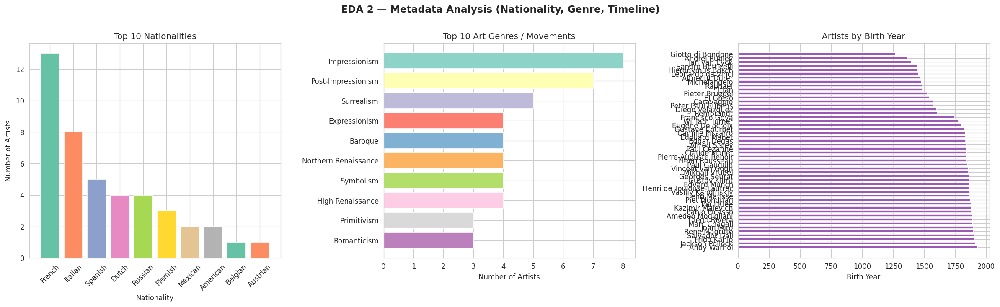

Observation: The dataset is dominated by European artists (French, Dutch, Italian, Spanish).
This confirms the Western art history scope stated in the project proposal.
The conversational pipeline (Pipeline B) will use the genre and nationality columns
to provide richer educational context in LLM-generated responses.


In [5]:
# Parse birth/death years for timeline analysis
# The 'years' column is typically formatted as 'YYYY - YYYY'
df_meta['birth_year'] = pd.to_numeric(
    df_meta['years'].str.extract(r'(\d{4})')[0], errors='coerce')
df_meta['death_year'] = pd.to_numeric(
    df_meta['years'].str.extract(r'\d{4}\s*-\s*(\d{4})')[0], errors='coerce')

fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# --- Plot 1: Top nationalities ---
nationality_counts = df_meta['nationality'].value_counts().head(10)
axes[0].bar(nationality_counts.index, nationality_counts.values,
            color=sns.color_palette('Set2', len(nationality_counts)))
axes[0].set_title('Top 10 Nationalities', fontsize=12)
axes[0].set_xlabel('Nationality')
axes[0].set_ylabel('Number of Artists')
axes[0].tick_params(axis='x', rotation=45)

# --- Plot 2: Art movements ---
# Split artists who belong to multiple genres
genre_series = df_meta['genre'].dropna().str.split(',').explode().str.strip()
genre_counts = genre_series.value_counts().head(10)
axes[1].barh(genre_counts.index, genre_counts.values,
             color=sns.color_palette('Set3', len(genre_counts)))
axes[1].set_title('Top 10 Art Genres / Movements', fontsize=12)
axes[1].set_xlabel('Number of Artists')
axes[1].invert_yaxis()

# --- Plot 3: Artist birth year timeline ---
df_timeline = df_meta.dropna(subset=['birth_year']).sort_values('birth_year')
axes[2].barh(df_timeline['name'], df_timeline['birth_year'],
             color='#9b59b6', height=0.6)
axes[2].set_title('Artists by Birth Year', fontsize=12)
axes[2].set_xlabel('Birth Year')
axes[2].invert_yaxis()

plt.suptitle('EDA 2 — Metadata Analysis (Nationality, Genre, Timeline)',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_metadata.png', dpi=150, bbox_inches='tight')
plt.show()

print('Observation: The dataset is dominated by European artists (French, Dutch, Italian, Spanish).')
print('This confirms the Western art history scope stated in the project proposal.')
print('The conversational pipeline (Pipeline B) will use the genre and nationality columns')
print('to provide richer educational context in LLM-generated responses.')

## 5. EDA — Sample Paintings per Artist

Visually inspecting a few paintings from each artist is one of the most important steps
in an image classification project. It helps us confirm:
- The data loaded correctly from each folder
- Each artist has a visually distinct style (important for model learnability)
- There are no obviously corrupted or mislabelled images

We display one sample painting for each of the 50 artists in a grid.

IndexError: index 50 is out of bounds for axis 0 with size 50

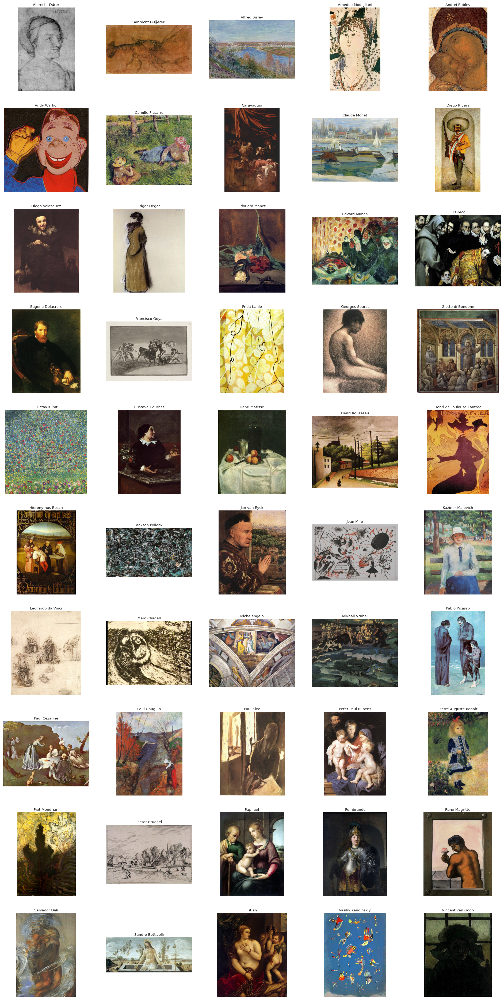

In [6]:
# Display one sample image per artist in a 10 x 5 grid
fig, axes = plt.subplots(10, 5, figsize=(20, 40))
axes = axes.flatten()

for i, folder in enumerate(artist_folders):
    images_in_folder = list(folder.glob('*.jpg'))
    if not images_in_folder:
        axes[i].axis('off')
        continue

    # Pick one image randomly (seeded for reproducibility)
    sample_path = random.choice(images_in_folder)
    img = Image.open(sample_path).convert('RGB')

    axes[i].imshow(img)
    axes[i].axis('off')
    # Display artist name, replacing underscores for readability
    artist_label = folder.name.replace('_', ' ')
    axes[i].set_title(artist_label, fontsize=8, pad=4)

# Hide any unused subplots if fewer than 50 artists
for j in range(len(artist_folders), len(axes)):
    axes[j].axis('off')

plt.suptitle('EDA 3 — One Sample Painting per Artist (50 Artists)',
             fontsize=16, fontweight='bold', y=1.005)
plt.tight_layout()
plt.savefig('eda_sample_paintings.png', dpi=100, bbox_inches='tight')
plt.show()

print('Observation: Each artist has a visually distinct style, colour palette, and subject matter.')
print('This visual diversity is what makes the classification task meaningful and learnable.')

## 6. EDA — Image Size and Aspect Ratio Analysis

Neural networks require all input images to be the same size, so we need to resize
all paintings before training. Before choosing a resize target, it is useful to understand
the natural size distribution of the images in the dataset.

This analysis justifies our choice to resize to **300 x 300 pixels** — the native
input size for EfficientNet-B3.

Images sampled: 1020
Width  — mean: 871px, min: 207px, max: 4001px
Height — mean: 925px, min: 234px, max: 3391px
Aspect ratio — mean: 0.99, std: 0.36


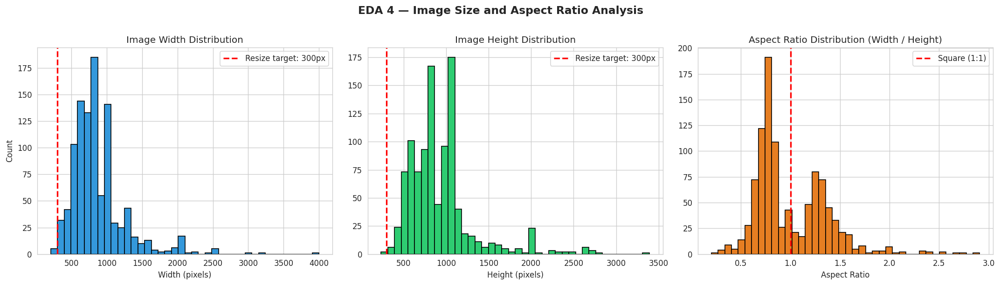


Observation: Images vary widely in size and are not square.
Resizing all images to 300x300 (EfficientNet-B3 native input size) is the correct choice.
Some aspect ratio distortion is acceptable given that painting style, colour, and texture
are the main discriminating signals rather than precise geometry.


In [7]:
widths, heights, aspect_ratios = [], [], []

# Sample up to 20 images per artist to keep this fast
for folder in artist_folders:
    images_in_folder = list(folder.glob('*.jpg'))
    sample = random.sample(images_in_folder, min(20, len(images_in_folder)))
    for img_path in sample:
        try:
            img = Image.open(img_path)
            w, h = img.size
            widths.append(w)
            heights.append(h)
            aspect_ratios.append(w / h)
        except Exception:
            pass  # skip any corrupted files

print(f'Images sampled: {len(widths)}')
print(f'Width  — mean: {np.mean(widths):.0f}px, min: {min(widths)}px, max: {max(widths)}px')
print(f'Height — mean: {np.mean(heights):.0f}px, min: {min(heights)}px, max: {max(heights)}px')
print(f'Aspect ratio — mean: {np.mean(aspect_ratios):.2f}, std: {np.std(aspect_ratios):.2f}')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

axes[0].hist(widths, bins=40, color='#3498db', edgecolor='black')
axes[0].axvline(300, color='red', linestyle='--', linewidth=2, label='Resize target: 300px')
axes[0].set_title('Image Width Distribution')
axes[0].set_xlabel('Width (pixels)')
axes[0].set_ylabel('Count')
axes[0].legend()

axes[1].hist(heights, bins=40, color='#2ecc71', edgecolor='black')
axes[1].axvline(300, color='red', linestyle='--', linewidth=2, label='Resize target: 300px')
axes[1].set_title('Image Height Distribution')
axes[1].set_xlabel('Height (pixels)')
axes[1].legend()

axes[2].hist(aspect_ratios, bins=40, color='#e67e22', edgecolor='black')
axes[2].axvline(1.0, color='red', linestyle='--', linewidth=2, label='Square (1:1)')
axes[2].set_title('Aspect Ratio Distribution (Width / Height)')
axes[2].set_xlabel('Aspect Ratio')
axes[2].legend()

plt.suptitle('EDA 4 — Image Size and Aspect Ratio Analysis',
             fontsize=14, fontweight='bold', y=1.01)
plt.tight_layout()
plt.savefig('eda_image_sizes.png', dpi=150, bbox_inches='tight')
plt.show()

print('\nObservation: Images vary widely in size and are not square.')
print('Resizing all images to 300x300 (EfficientNet-B3 native input size) is the correct choice.')
print('Some aspect ratio distortion is acceptable given that painting style, colour, and texture')
print('are the main discriminating signals rather than precise geometry.')

## 7. EDA — Average Colour per Artist

Different artists are known for very different colour palettes. Van Gogh used intense
yellows and blues; Rembrandt is associated with dark earthy tones. This EDA step
computes the average RGB colour of all paintings for a selection of well-known artists
and displays them as colour swatches.

This is a simple but visually compelling visualisation that illustrates why a CNN
can learn to distinguish artistic styles — colour alone carries some signal.

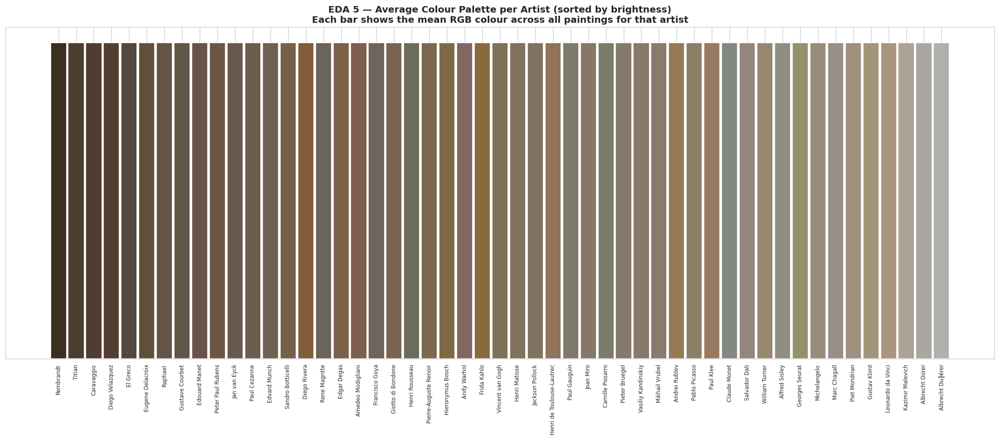

5 darkest average palettes : ['Rembrandt', 'Titian', 'Caravaggio', 'Diego Velazquez', 'El Greco']
5 brightest average palettes: ['Gustav Klimt', 'Leonardo da Vinci', 'Kazimir Malevich', 'Albrecht Dürer', 'Albrecht Du╠êrer']

Observation: Artists differ meaningfully in average brightness and colour tone.
This confirms that colour is a useful discriminating signal for the CNN classifier.


In [8]:
def average_colour(folder, max_images=30):
    """Compute the mean RGB colour across a sample of paintings in a folder."""
    images_in_folder = list(folder.glob('*.jpg'))
    sample = random.sample(images_in_folder, min(max_images, len(images_in_folder)))
    all_pixels = []
    for img_path in sample:
        try:
            img = Image.open(img_path).convert('RGB').resize((100, 100))
            all_pixels.append(np.array(img).reshape(-1, 3))
        except Exception:
            pass
    if not all_pixels:
        return (128, 128, 128)  # fallback grey
    mean_rgb = np.concatenate(all_pixels).mean(axis=0)
    return tuple(mean_rgb.astype(int))

# Compute average colour for all 50 artists
avg_colours = {}
for folder in artist_folders:
    avg_colours[folder.name.replace('_', ' ')] = average_colour(folder)

# Sort by perceived brightness (R*0.299 + G*0.587 + B*0.114)
brightness = lambda rgb: rgb[0]*0.299 + rgb[1]*0.587 + rgb[2]*0.114
sorted_artists = sorted(avg_colours.items(), key=lambda x: brightness(x[1]))

# Plot colour swatches
n = len(sorted_artists)
fig, ax = plt.subplots(figsize=(18, 8))

for i, (name, rgb) in enumerate(sorted_artists):
    # Normalise RGB to 0-1 for matplotlib
    colour = tuple(c / 255 for c in rgb)
    ax.bar(i, 1, color=colour, width=0.9)

ax.set_xticks(range(n))
ax.set_xticklabels([a[0] for a in sorted_artists],
                   rotation=90, fontsize=7)
ax.set_yticks([])
ax.set_title('EDA 5 — Average Colour Palette per Artist (sorted by brightness)\n'
             'Each bar shows the mean RGB colour across all paintings for that artist',
             fontsize=12, fontweight='bold')

plt.tight_layout()
plt.savefig('eda_colour_palettes.png', dpi=150, bbox_inches='tight')
plt.show()

# Print the 5 darkest and 5 brightest artists
print('5 darkest average palettes :', [a[0] for a in sorted_artists[:5]])
print('5 brightest average palettes:', [a[0] for a in sorted_artists[-5:]])
print('\nObservation: Artists differ meaningfully in average brightness and colour tone.')
print('This confirms that colour is a useful discriminating signal for the CNN classifier.')

## 8. EDA Summary

The five EDA steps above tell us everything we need to make good training decisions:

| EDA Step | Finding | Training Decision |
|---|---|---|
| Class distribution | Imbalanced (24–119 images per artist) | Use WeightedRandomSampler |
| Metadata analysis | Rich CSV with genre, nationality, bio | Use CSV as structured context for LLM pipeline |
| Sample paintings | Visually distinct styles across artists | Classification is learnable |
| Image sizes | Highly variable, non-square | Resize all to 300×300 (EfficientNet-B3 input) |
| Colour palettes | Artists differ in brightness and tone | Colour is a valid learning signal for the CNN |

We now proceed to model training with these decisions in place.

---
# PART 2 — Model Training

We fine-tune a pretrained EfficientNet-B3 on the 50-artist dataset using a two-phase
transfer learning strategy:

- **Phase 1 (5 epochs):** Freeze the backbone. Train only the new classification head.
  This warms up the head weights before the full network is unlocked.
- **Phase 2 (15 epochs):** Unfreeze all layers. Fine-tune the entire network at a lower
  learning rate, allowing the pretrained features to adapt to painting-style recognition.

This two-phase approach is standard practice for transfer learning on small datasets.
It prevents the randomly initialised head from damaging the pretrained backbone weights
with large gradients during the first few epochs.

## 9. Build Image List & Class Index

In [9]:
all_images   = []   # list of (path_str, label_int)
class_to_idx = {}   # {artist_folder_name: class_index}

for idx, folder in enumerate(artist_folders):
    class_name = folder.name
    class_to_idx[class_name] = idx
    for img_path in folder.glob('*.jpg'):
        all_images.append((str(img_path), idx))

# Save class index — required by the Gradio inference app to map
# the model's integer output back to an artist name
with open('class_indices.json', 'w') as f:
    json.dump(class_to_idx, f, indent=2)

print(f'Total images : {len(all_images)}')
print(f'Total classes: {len(class_to_idx)}')
print('class_indices.json saved.')

Total images : 8774
Total classes: 51
class_indices.json saved.


## 10. Train / Validation Split & Dataset Class

We use an 80/20 stratified split, meaning each artist appears in both train and val
in the same proportion. This ensures the validation set is a fair representation of
all 50 classes.

**Data augmentation** is applied only to the training set. The validation set receives
only resize and normalise — no random flipping or jitter — so that validation accuracy
reflects real performance on unseen clean images.

In [10]:
paths  = [x[0] for x in all_images]
labels = [x[1] for x in all_images]

train_paths, val_paths, train_labels, val_labels = train_test_split(
    paths, labels,
    test_size=0.2,
    stratify=labels,       # preserve class proportions in both splits
    random_state=SEED
)
print(f'Train: {len(train_paths)} images | Val: {len(val_paths)} images')

# ImageNet normalisation values — used because EfficientNet-B3 was pretrained on ImageNet
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]

train_transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.RandomHorizontalFlip(),            # paintings can be flipped without losing meaning
    transforms.RandomRotation(15),                # slight rotation simulates tilted photos
    transforms.ColorJitter(brightness=0.2,        # small colour variations for robustness
                           contrast=0.2,
                           saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

val_transform = transforms.Compose([
    transforms.Resize((300, 300)),
    transforms.ToTensor(),
    transforms.Normalize(IMAGENET_MEAN, IMAGENET_STD),
])

class ArtDataset(Dataset):
    """Custom Dataset that loads painting images from file paths."""
    def __init__(self, paths, labels, transform=None):
        self.paths     = paths
        self.labels    = labels
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        image = Image.open(self.paths[idx]).convert('RGB')
        if self.transform:
            image = self.transform(image)
        return image, self.labels[idx]

train_dataset = ArtDataset(train_paths, train_labels, train_transform)
val_dataset   = ArtDataset(val_paths,   val_labels,   val_transform)
print('Datasets created.')

Train: 7019 images | Val: 1755 images
Datasets created.


## 11. Weighted Sampler (Address Class Imbalance)

Because the dataset is imbalanced (identified in EDA Step 1), we use a
**WeightedRandomSampler** so that artists with fewer paintings are sampled
more frequently during training.

Each sample is assigned a weight equal to `1 / class_count`. This means
a painting from an artist with only 24 works gets sampled roughly 5x
more often than a painting from an artist with 119 works, balancing
the effective training distribution.

In [11]:
label_counts   = Counter(train_labels)
class_weights  = {cls: 1.0 / count for cls, count in label_counts.items()}
sample_weights = [class_weights[lbl] for lbl in train_labels]

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True,   # replacement=True allows oversampling minority classes
)

# batch_size=32 is a good balance between memory usage and gradient stability
train_loader = DataLoader(train_dataset, batch_size=32, sampler=sampler,
                          num_workers=2, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=32, shuffle=False,
                          num_workers=2, pin_memory=True)

print(f'Train batches: {len(train_loader)} | Val batches: {len(val_loader)}')
print('WeightedRandomSampler applied — all 50 artists now receive equal training attention.')

Train batches: 220 | Val batches: 55
WeightedRandomSampler applied — all 50 artists now receive equal training attention.


## 12. Build Model (EfficientNet-B3)

We use a pretrained EfficientNet-B3 as the backbone. EfficientNet-B3 was chosen
because:
- It is pretrained on ImageNet (1.2M images), so it already understands textures,
  edges, and colour patterns — all relevant to painting style recognition
- Its 300×300 native input size is appropriate for painting images
- It is compact enough to train on Kaggle's free GPU within a reasonable time

We replace only the final classification layer with a new `Linear(in_features, 50)`
layer, mapping to our 50 artist classes.

In [12]:
NUM_CLASSES = len(class_to_idx)   # 50

# Load EfficientNet-B3 with pretrained ImageNet weights
model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.DEFAULT)

# Phase 1: Freeze the entire backbone so only the new head is trained initially
for param in model.parameters():
    param.requires_grad = False

# Replace the final classifier layer
# The original head was Linear(1536, 1000) for ImageNet's 1000 classes
# We replace it with Linear(1536, 50) for our 50 artists
in_features = model.classifier[1].in_features
model.classifier[1] = nn.Linear(in_features, NUM_CLASSES)

model = model.to(DEVICE)
print(f'Model ready: EfficientNet-B3 with {NUM_CLASSES} output classes')
print(f'New classifier head: Linear({in_features}, {NUM_CLASSES})')

# Count trainable vs frozen parameters
trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
frozen    = sum(p.numel() for p in model.parameters() if not p.requires_grad)
print(f'Trainable parameters: {trainable:,} | Frozen: {frozen:,}')

Downloading: "https://download.pytorch.org/models/efficientnet_b3_rwightman-b3899882.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b3_rwightman-b3899882.pth


100%|██████████| 47.2M/47.2M [00:00<00:00, 171MB/s] 


Model ready: EfficientNet-B3 with 51 output classes
New classifier head: Linear(1536, 51)
Trainable parameters: 78,387 | Frozen: 10,696,232


## 13. Training Helper Function

In [14]:
def run_epoch(model, loader, criterion, optimizer=None):
    """
    Run one full pass through the dataloader.
    - If optimizer is provided: training mode (gradients computed and applied)
    - If optimizer is None: evaluation mode (no gradients, faster)
    Returns: (average_loss, accuracy)
    """
    is_train = optimizer is not None
    model.train() if is_train else model.eval()

    total_loss, correct, total = 0.0, 0, 0

    # torch.no_grad() disables gradient computation during validation
    # to save memory and speed things up
    context = torch.enable_grad() if is_train else torch.no_grad()

    with context:
        for images, labels in loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)               # forward pass
            loss    = criterion(outputs, labels)  # compute loss

            if is_train:
                optimizer.zero_grad()   # clear previous gradients
                loss.backward()         # backpropagate
                optimizer.step()        # update weights

            total_loss += loss.item() * images.size(0)
            preds       = outputs.argmax(dim=1)  # predicted class = highest logit
            correct    += (preds == labels).sum().item()
            total      += images.size(0)

    return total_loss / total, correct / total

## 14. Phase 1 — Train Classification Head Only (5 epochs)

In Phase 1 the backbone is still frozen. We train only the new `Linear(1536, 50)` head
at a relatively high learning rate (1e-3). This allows the head to converge to reasonable
weights before we open up the full network.

**CosineAnnealingLR** is used as the learning rate scheduler. It gradually reduces the
learning rate following a cosine curve, which helps the model settle into a good minimum
rather than oscillating around it.

In [15]:
# CrossEntropyLoss is the standard loss for multi-class classification
# It combines a softmax with negative log-likelihood
criterion = nn.CrossEntropyLoss()

# Only pass the classifier parameters — the backbone is frozen
optimizer1 = optim.AdamW(model.classifier.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler1 = optim.lr_scheduler.CosineAnnealingLR(optimizer1, T_max=5)

PHASE1_EPOCHS = 5
history = {'train_loss': [], 'train_acc': [], 'val_loss': [], 'val_acc': []}

print('Phase 1: Training classifier head only (backbone frozen)')
print('-' * 65)

for epoch in range(1, PHASE1_EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(model, train_loader, criterion, optimizer1)
    vl_loss, vl_acc = run_epoch(model, val_loader,   criterion)
    scheduler1.step()

    history['train_loss'].append(tr_loss)
    history['train_acc'].append(tr_acc)
    history['val_loss'].append(vl_loss)
    history['val_acc'].append(vl_acc)

    print(f'Epoch {epoch}/{PHASE1_EPOCHS} | '
          f'Train Loss: {tr_loss:.4f} Acc: {tr_acc:.3f} | '
          f'Val Loss: {vl_loss:.4f} Acc: {vl_acc:.3f}')

print('\nPhase 1 complete. Head is warmed up. Proceeding to full fine-tune.')

Phase 1: Training classifier head only (backbone frozen)
-----------------------------------------------------------------
Epoch 1/5 | Train Loss: 2.9089 Acc: 0.367 | Val Loss: 2.4327 Acc: 0.435
Epoch 2/5 | Train Loss: 1.9564 Acc: 0.568 | Val Loss: 2.0103 Acc: 0.490
Epoch 3/5 | Train Loss: 1.6716 Acc: 0.605 | Val Loss: 1.8650 Acc: 0.508
Epoch 4/5 | Train Loss: 1.5215 Acc: 0.650 | Val Loss: 1.8017 Acc: 0.523
Epoch 5/5 | Train Loss: 1.4741 Acc: 0.650 | Val Loss: 1.7667 Acc: 0.531

Phase 1 complete. Head is warmed up. Proceeding to full fine-tune.


## 15. Phase 2 — Full Fine-tune (All Layers, 15 epochs)

In Phase 2 we unfreeze the entire network and train all layers together at a lower
learning rate (1e-4). This allows the pretrained ImageNet features to adapt to the
specific visual characteristics of paintings.

**Best model checkpointing:** We save the model weights whenever validation accuracy
improves. This ensures we keep the best-performing version of the model, even if
performance dips slightly in later epochs.

In [ ]:
# Unfreeze all layers for full fine-tuning
for param in model.parameters():
    param.requires_grad = True

PHASE2_EPOCHS = 15

# Lower learning rate (1e-4) to avoid destroying the pretrained features
optimizer2 = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-4)
scheduler2 = optim.lr_scheduler.CosineAnnealingLR(optimizer2, T_max=PHASE2_EPOCHS)

best_val_acc = 0.0
MODEL_PATH   = 'efficientnet_b3_artsense.pth'

print('Phase 2: Fine-tuning all layers')
print('-' * 65)

for epoch in range(1, PHASE2_EPOCHS + 1):
    tr_loss, tr_acc = run_epoch(model, train_loader, criterion, optimizer2)
    vl_loss, vl_acc = run_epoch(model, val_loader,   criterion)
    scheduler2.step()

    history['train_loss'].append(tr_loss)
    history['train_acc'].append(tr_acc)
    history['val_loss'].append(vl_loss)
    history['val_acc'].append(vl_acc)

    saved = ''
    if vl_acc > best_val_acc:
        best_val_acc = vl_acc
        torch.save(model.state_dict(), MODEL_PATH)  # save only the weights, not the full model
        saved = '  <-- best model saved'

    print(f'Epoch {epoch}/{PHASE2_EPOCHS} | '
          f'Train Loss: {tr_loss:.4f} Acc: {tr_acc:.3f} | '
          f'Val Loss: {vl_loss:.4f} Acc: {vl_acc:.3f}{saved}')

print(f'\nPhase 2 complete. Best validation accuracy: {best_val_acc:.3f}')

## 16. Training Curves

The training curves show how loss and accuracy evolved over both phases.
The vertical dashed line marks the transition from Phase 1 (head only) to
Phase 2 (full fine-tune). A healthy training run shows:
- Loss decreasing in both train and val
- Accuracy increasing in both train and val
- A small gap between train and val (large gap = overfitting)

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
epochs = range(1, len(history['train_loss']) + 1)

ax1.plot(epochs, history['train_loss'], label='Train', color='#3498db')
ax1.plot(epochs, history['val_loss'],   label='Val',   color='#e74c3c')
ax1.axvline(x=PHASE1_EPOCHS + 0.5, color='gray',
            linestyle='--', label='Unfreeze (Phase 2 start)')
ax1.set_title('Loss per Epoch')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Cross-Entropy Loss')
ax1.legend()

ax2.plot(epochs, history['train_acc'], label='Train', color='#3498db')
ax2.plot(epochs, history['val_acc'],   label='Val',   color='#e74c3c')
ax2.axvline(x=PHASE1_EPOCHS + 0.5, color='gray',
            linestyle='--', label='Unfreeze (Phase 2 start)')
ax2.set_title('Accuracy per Epoch')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy')
ax2.legend()

plt.suptitle('Training Curves — Phase 1 (Head Only) + Phase 2 (Full Fine-tune)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

## 17. Kaggle Inference Test

Before downloading the artefacts, run a sanity check inside Kaggle to confirm the saved
checkpoint loads correctly and produces sensible predictions. This mirrors how
`app/classifier.py` will load the model locally — passing here gives confidence the
file will plug into the Gradio app cleanly.

We:
1. Reload the best checkpoint from `efficientnet_b3_artsense.pth`
2. Pick 6 random validation-set paintings
3. Show the predicted artist, top-3 confidences, and the true label side-by-side
4. Expose a reusable `predict(image_path)` helper so you can also test on any image you
   upload via the Kaggle sidebar (Add Data → Upload)

In [ ]:
# Local imports so this cell can be re-run on its own without relying on the
# install cell's imports being still in memory (Kaggle kernels can idle out).
import random
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from PIL import Image
import matplotlib.pyplot as plt

# This cell still needs train/val state from earlier cells:
#   val_paths, val_labels, val_transform, class_to_idx, NUM_CLASSES,
#   in_features, MODEL_PATH, DEVICE, best_val_acc
# If you get a NameError on any of those, run "Run All Above" first.

# Reload the best checkpoint exactly the way the Gradio app's classifier.py does.
# This validates that the saved file is loadable end-to-end before we download it.
inference_model = models.efficientnet_b3(weights=None)
inference_model.classifier[1] = nn.Linear(in_features, NUM_CLASSES)
inference_model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
inference_model.to(DEVICE).eval()

# class index -> artist display name (with spaces, matching artists.csv)
idx_to_class = {v: k.replace('_', ' ') for k, v in class_to_idx.items()}

CONFIDENCE_THRESHOLD = 0.80   # mirrors app/classifier.py


def predict(img_path):
    """Return the top-3 (artist_name, probability) predictions for an image path."""
    img    = Image.open(img_path).convert('RGB')
    tensor = val_transform(img).unsqueeze(0).to(DEVICE)
    with torch.no_grad():
        probs = F.softmax(inference_model(tensor), dim=1)[0]
    top3_p, top3_i = torch.topk(probs, 3)
    return [(idx_to_class[i.item()], p.item()) for i, p in zip(top3_i, top3_p)]


# --- Sanity check: 6 random validation images, predicted vs. true ---
# A fresh Random() instance is seeded from system time, so each run of this cell
# picks a different 6-image sample (independent of the global SEED set at the top
# of the notebook for reproducible training).
rng = random.Random()
sample_indices = rng.sample(range(len(val_paths)), 6)

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()
correct = 0

for ax, idx in zip(axes, sample_indices):
    path       = val_paths[idx]
    true_name  = idx_to_class[val_labels[idx]]
    top3       = predict(path)
    pred, conf = top3[0]
    declined   = conf < CONFIDENCE_THRESHOLD
    is_correct = (pred == true_name)
    correct   += int(is_correct)

    ax.imshow(Image.open(path).convert('RGB'))
    ax.axis('off')
    title = (
        f'True : {true_name}\n'
        f'Pred : {pred} ({conf*100:.1f}%)' + ('  [DECLINED]' if declined else '') + '\n'
        f'Top-3: ' + ', '.join(f'{n} {p*100:.0f}%' for n, p in top3)
    )
    ax.set_title(title, fontsize=8, color=('green' if is_correct else 'red'))

plt.suptitle(f'Kaggle Inference Sanity Check — {correct}/{len(sample_indices)} correct',
             fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print('=== Inference Test Summary ===')
print(f'Correct on sample : {correct}/{len(sample_indices)}')
print(f'Best val accuracy : {best_val_acc:.3f}')
print(f'Confidence thresh : {CONFIDENCE_THRESHOLD}')
print()
print('Re-run this cell to test on a different random sample of 6 validation images.')
print('To test on your own image, upload it via the Kaggle sidebar')
print('(Add Data -> Upload) and call predict() with the file path, e.g.:')
print('    for name, prob in predict("/kaggle/input/<your-upload>/<file>.jpg"):')
print('        print(f"{name:30s} {prob*100:5.1f}%")')

## 18. Verify & Download Output Files

After training and the inference sanity check pass, verify all output files were saved
correctly, then download them from the Kaggle output panel on the right.

Place them in your local Gradio project:
- `efficientnet_b3_artsense.pth` → `model/`
- `class_indices.json` → `model/`
- `training_curves.png` → optional, for reporting

In [ ]:
output_files = [
    'efficientnet_b3_artsense.pth',
    'class_indices.json',
    'training_curves.png',
    'eda_class_distribution.png',
    'eda_metadata.png',
    'eda_sample_paintings.png',
    'eda_image_sizes.png',
    'eda_colour_palettes.png',
]

print('=== Output File Check ===')
for fname in output_files:
    if os.path.exists(fname):
        size_mb = os.path.getsize(fname) / 1e6
        print(f'  OK   {fname} ({size_mb:.1f} MB)')
    else:
        print(f'  MISSING  {fname}')

print(f'\nFinal best validation accuracy : {best_val_acc:.4f}')
print('\nDownload efficientnet_b3_artsense.pth and class_indices.json')
print('from the Kaggle output panel and place them in your model/ folder.')